In [1]:
import os
os.chdir(r'C:\Users\anitk\OneDrive\Desktop\Research_work\Landsat_8\LC08_L2SP_143052_20230213_20230218_02_T1')
os.getcwd()

'C:\\Users\\anitk\\OneDrive\\Desktop\\Research_work\\Landsat_8\\LC08_L2SP_143052_20230213_20230218_02_T1'

In [2]:
import rasterio as rio
import numpy as np
import pandas as pd
import geopandas as gpd
gpd.options.io_engine = "fiona"
from rasterio.plot import show
from rasterio.features import rasterize
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pathlib import Path
from ipywidgets import interact
from rasterio.mask import mask
from shapely.geometry import mapping
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import json

from rasterio.features import rasterize

In [3]:
# Define your base path (adjust this to your actual file location)
base_name = 'LC08_L2SP_143052_20230213_20230218_02_T1'
base_path = Path('.')

In [4]:
# Get extent from first band (geospatial bounds)
band_file = base_path / f'{base_name}_SR_B2.TIF'

print(f"Loading extent from: {band_file}")
print(f"File exists: {band_file.exists()}\n")

with rio.open(band_file) as src:
    extent = [src.bounds.left, src.bounds.right,
              src.bounds.bottom, src.bounds.top]  # [left, right, bottom, top] for imshow
    transform = src.transform
    crs = src.crs
    shape = src.shape
    
    print("GEOSPATIAL INFORMATION")
    print(f"CRS: {crs}")
    print(f"EPSG Code: {crs.to_epsg()}")
    print(f"\nBounds:")
    print(f"  Left (West):   {src.bounds.left:,.2f}")
    print(f"  Right (East):  {src.bounds.right:,.2f}")
    print(f"  Bottom (South): {src.bounds.bottom:,.2f}")
    print(f"  Top (North):    {src.bounds.top:,.2f}")
    print(f"\nImage Dimensions:")
    print(f"  Width:  {shape[1]} pixels")
    print(f"  Height: {shape[0]} pixels")
    print(f"\nPixel Size:")
    print(f"  X: {transform[0]:.2f} meters")
    print(f"  Y: {-transform[4]:.2f} meters")
    print(f"\nExtent for plotting: {extent}")

Loading extent from: LC08_L2SP_143052_20230213_20230218_02_T1_SR_B2.TIF
File exists: True

GEOSPATIAL INFORMATION
CRS: EPSG:32644
EPSG Code: 32644

Bounds:
  Left (West):   109,785.00
  Right (East):  339,015.00
  Bottom (South): 1,162,785.00
  Top (North):    1,396,515.00

Image Dimensions:
  Width:  7641 pixels
  Height: 7791 pixels

Pixel Size:
  X: 30.00 meters
  Y: 30.00 meters

Extent for plotting: [109785.0, 339015.0, 1162785.0, 1396515.0]


In [5]:
print("\nLoading spectral bands...")
bands = {}
band_names = {
    'B1': 'Coastal Aerosol',
    'B2': 'Blue',
    'B3': 'Green',
    'B4': 'Red',
    'B5': 'NIR',
    'B6': 'SWIR1',
    'B7': 'SWIR2'
}

for band_id, band_desc in band_names.items():
    band_file = base_path / f'{base_name}_SR_{band_id}.TIF'
    
    with rio.open(band_file) as src:
        band_data = src.read(1).astype(np.float32)
        
        # Apply scaling to reflectance
        band_data = band_data * 0.0000275 - 0.2
        band_data = np.clip(band_data, 0, 1)
        
        # Store with proper name
        bands[band_id] = band_data
        print(f"Loaded {band_id} ({band_desc}): {band_data.shape}")

print(f"\nTotal bands loaded: {len(bands)}")


Loading spectral bands...
Loaded B1 (Coastal Aerosol): (7791, 7641)
Loaded B2 (Blue): (7791, 7641)
Loaded B3 (Green): (7791, 7641)
Loaded B4 (Red): (7791, 7641)
Loaded B5 (NIR): (7791, 7641)
Loaded B6 (SWIR1): (7791, 7641)
Loaded B7 (SWIR2): (7791, 7641)

Total bands loaded: 7


In [6]:
print("\nLoading quality mask...")
qa_file = base_path / f'{base_name}_QA_PIXEL.TIF'

with rio.open(qa_file) as src:
    qa_band = src.read(1)

def extract_qa_bits(qa_band):
    """Extract quality flags using bit manipulation"""
    cloud = (qa_band >> 3) & 1
    cloud_shadow = (qa_band >> 4) & 1
    dilated_cloud = (qa_band >> 1) & 1
    
    # Create mask (True = valid pixel)
    valid_mask = (cloud == 0) & (cloud_shadow == 0) & (dilated_cloud == 0)
    return valid_mask

valid_mask = extract_qa_bits(qa_band)

# Apply mask to all bands
for band_id in bands.keys():
    bands[band_id][~valid_mask] = np.nan

print(f"  Applied quality mask")
print(f"  Valid pixels: {np.sum(valid_mask):,} ({np.sum(valid_mask)/valid_mask.size*100:.1f}%)")
print(f"  Masked pixels: {np.sum(~valid_mask):,} ({np.sum(~valid_mask)/valid_mask.size*100:.1f}%)")


Loading quality mask...
  Applied quality mask
  Valid pixels: 59,286,750 (99.6%)
  Masked pixels: 244,281 (0.4%)


Use the interactive widget below to view different bands


interactive(children=(Dropdown(description='band', options={'B1 - Coastal Aerosol': 'B1', 'B2 - Blue': 'B2', '…


Generating overview of all bands...


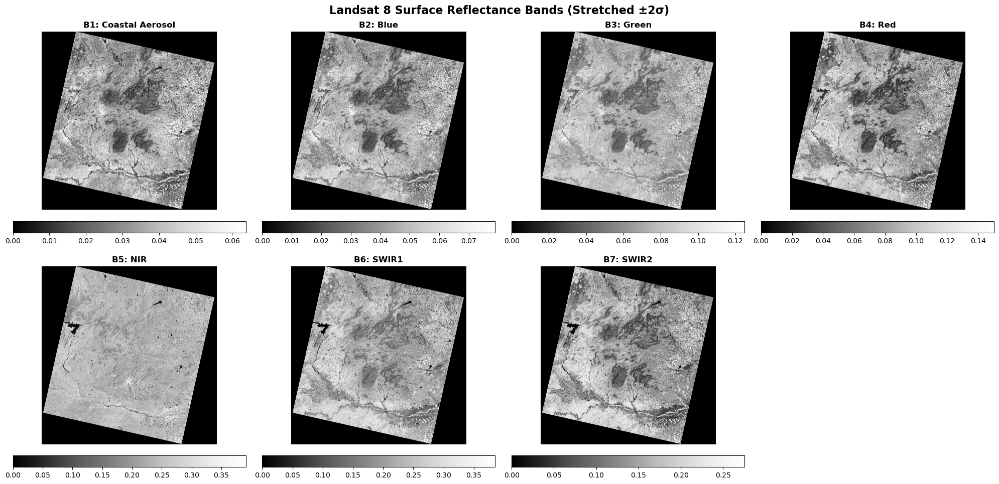


Generating RGB composite...


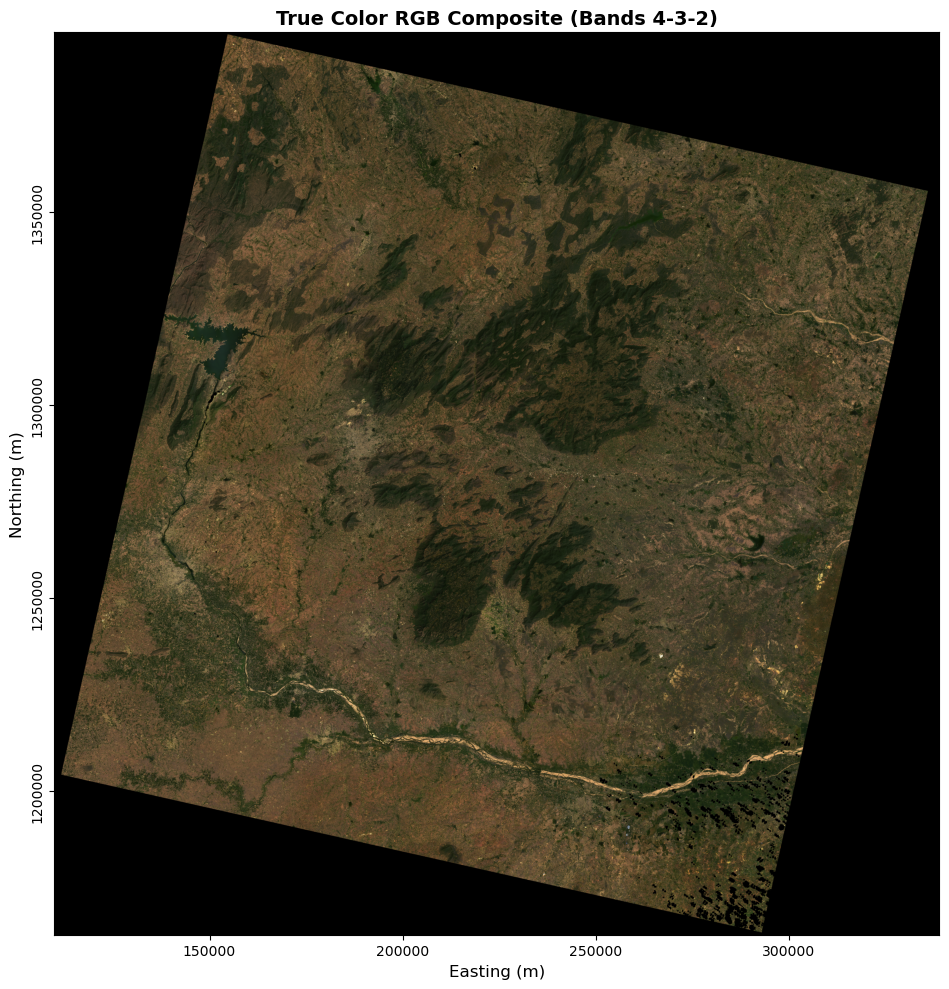

In [7]:
#Visualization
def plot_array_stretched(array, label, n=3, extent=None):
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Handle NaN values
    valid_array = np.ma.masked_invalid(array)
    v_mean = np.nanmean(valid_array)
    v_std = np.nanstd(valid_array)
    
    # Calculate stretch limits
    vmin = max(0, v_mean - (n * v_std))
    vmax = min(1, v_mean + (n * v_std))
    
    # Plot with geospatial extent
    im = ax.imshow(valid_array, cmap='Greys_r', 
                   extent=extent if extent else None,
                   vmin=vmin, 
                   vmax=vmax)
    
    # Formatting
    if extent:
        ax.set_xlabel('Easting (m)', fontsize=12)
        ax.set_ylabel('Northing (m)', fontsize=12)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
        ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
        plt.yticks(rotation=90, va='center')
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.5)
    cbar = plt.colorbar(im, orientation='horizontal', label=label, cax=cax)
    
    # Title with statistics
    ax.set_title(f'{label}\n(Stretched: μ±{n}σ | Range: {vmin:.3f} - {vmax:.3f})', 
                 fontsize=14, fontweight='bold')
    
    ax.grid(False)
    plt.tight_layout()
    plt.show()


# INTERACTIVE BAND VIEWER
print("Use the interactive widget below to view different bands")

# Create dropdown options
band_options = {f'{bid} - {band_names[bid]}': bid for bid in bands.keys()}

@interact(band=band_options, stretch=[1, 2, 3, 4, 5])
def show_band_interactive(band, stretch=3):
    band_data = bands[band]
    band_label = f'{band} ({band_names[band]}) - Surface Reflectance'
    plot_array_stretched(band_data, band_label, n=stretch, extent=extent)



# STATIC VISUALIZATION OF ALL BANDS
def plot_all_bands(bands_dict, extent, stretch=2):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()
    
    for idx, (band_id, band_data) in enumerate(bands_dict.items()):
        if idx < len(axes):
            ax = axes[idx]
            
            # Handle NaN values
            valid_array = np.ma.masked_invalid(band_data)
            v_mean = np.nanmean(valid_array)
            v_std = np.nanstd(valid_array)
            
            vmin = max(0, v_mean - (stretch * v_std))
            vmax = min(1, v_mean + (stretch * v_std))
            
            # Plot
            im = ax.imshow(valid_array, cmap='Greys_r', 
                          extent=extent,
                          vmin=vmin, vmax=vmax)
            
            ax.set_title(f'{band_id}: {band_names[band_id]}', 
                        fontsize=12, fontweight='bold')
            ax.axis('off')
            
            # Add colorbar
            plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05)
    
    # Remove extra subplot
    if len(bands_dict) < len(axes):
        fig.delaxes(axes[-1])
    
    plt.suptitle('Landsat 8 Surface Reflectance Bands (Stretched ±2σ)', 
                 fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()

# Display all bands
print("\nGenerating overview of all bands...")
plot_all_bands(bands, extent, stretch=2)

# TRUE COLOR RGB COMPOSITE
def plot_rgb_composite(bands_dict, extent):
    rgb = np.stack([
        bands_dict['B4'],  # Red
        bands_dict['B3'],  # Green
        bands_dict['B2']   # Blue
    ], axis=-1)
    
    # Handle NaN
    rgb = np.nan_to_num(rgb, nan=0.0)
    
    # Enhance for visualization (adjust multiplier as needed)
    rgb_enhanced = np.clip(rgb * 3.5, 0, 1)
    
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.imshow(rgb_enhanced, extent=extent)
    ax.set_xlabel('Easting (m)', fontsize=12)
    ax.set_ylabel('Northing (m)', fontsize=12)
    ax.set_title('True Color RGB Composite (Bands 4-3-2)', 
                fontsize=14, fontweight='bold')
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
    plt.yticks(rotation=90, va='center')
    plt.tight_layout()
    plt.show()

print("\nGenerating RGB composite...")
plot_rgb_composite(bands, extent)

In [10]:
# Check normalization
normalized_multispectral = np.stack([bands[f'B{i}'] for i in range(1, 8)], axis=0)

print("NORMALIZATION STATUS")
print(" Bands already normalized to [0, 1] from reflectance scaling")
print(f"Shape: {normalized_multispectral.shape}")
print(f"Range: [{np.nanmin(normalized_multispectral):.4f}, {np.nanmax(normalized_multispectral):.4f}]")

NORMALIZATION STATUS
 Bands already normalized to [0, 1] from reflectance scaling
Shape: (7, 7791, 7641)
Range: [0.0000, 1.0000]


In [12]:
# LOAD AND EXPLORE SHAPEFILE
print("LOADING SHAPEFILE")

# Load the shapefile
shapefile_path = 'gadm41_IND_3.shp'
gdf = gpd.read_file(shapefile_path)

print(f" Shapefile loaded successfully")
print(f"  Total features: {len(gdf)}")
print(f"  CRS: {gdf.crs}")

LOADING SHAPEFILE
 Shapefile loaded successfully
  Total features: 2347
  CRS: EPSG:4326


In [13]:
# FILTER SALEM SUB-DISTRICTS
print("FILTERING SALEM SUB-DISTRICTS")

# Target sub-districts
target_subdistricts = ['Attur', 'Mettur', 'Omalur', 'Salem', 'Sankari']

# Find the correct column name (usually NAME_3 for sub-districts in GADM)
# Let's check which column contains these names
name_col = None
for col in gdf.columns:
    if gdf[col].dtype == 'object':  # String column
        matches = gdf[col].isin(target_subdistricts).sum()
        if matches > 0:
            name_col = col
            print(f"✓ Found sub-district names in column: '{col}'")
            print(f"  Matches found: {matches}/{len(target_subdistricts)}")
            break
            

if name_col is None:
    print(" Could not automatically detect the name column.")
    print("Available columns:")
    for col in gdf.columns:
        if gdf[col].dtype == 'object':
            print(f"  - {col}: {gdf[col].unique()[:5].tolist()}")
    name_col = 'NAME_3'  # Default assumption for GADM level 3
    print(f"\nUsing default column: '{name_col}'")

# Filter Salem sub-districts
salem_subdistricts = gdf[gdf[name_col].isin(target_subdistricts)].copy()

print(f"\n Filtered {len(salem_subdistricts)} sub-districts:")
for idx, row in salem_subdistricts.iterrows():
    print(f"  - {row[name_col]}")

# Check if all sub-districts were found
found_names = salem_subdistricts[name_col].tolist()
missing = [name for name in target_subdistricts if name not in found_names]
if missing:
    print(f"\n Missing sub-districts: {missing}")
    print("  Checking for similar names...")
    for miss in missing:
        similar = gdf[gdf[name_col].str.contains(miss, case=False, na=False)]
        if len(similar) > 0:
            print(f"    Similar to '{miss}': {similar[name_col].tolist()}")

FILTERING SALEM SUB-DISTRICTS
 Could not automatically detect the name column.
Available columns:

Using default column: 'NAME_3'

 Filtered 5 sub-districts:
  - Attur
  - Mettur
  - Omalur
  - Salem
  - Sankari


In [14]:
# REPROJECT TO MATCH LANDSAT CRS
print("COORDINATE SYSTEM ALIGNMENT")

# Get Landsat CRS (base_name and base_path already defined above)
landsat_file = base_path / f'{base_name}_SR_B2.TIF'

with rio.open(landsat_file) as src:
    landsat_crs = src.crs
    landsat_bounds = src.bounds
    landsat_transform = src.transform
    landsat_shape = (src.height, src.width)

print(f"Shapefile CRS: {salem_subdistricts.crs}")
print(f"Landsat CRS: {landsat_crs}")

# Reproject shapefile to match Landsat
if salem_subdistricts.crs != landsat_crs:
    print("\n Reprojecting shapefile to match Landsat CRS...")
    salem_subdistricts_proj = salem_subdistricts.to_crs(landsat_crs)
else:
    salem_subdistricts_proj = salem_subdistricts.copy()

print(f"Reprojection complete")

# Check if geometries overlap with Landsat scene
salem_bounds = salem_subdistricts_proj.total_bounds
print(f"\nSalem bounds: {salem_bounds}")
print(f"Landsat bounds: {landsat_bounds}")

# Check overlap
overlap = (salem_bounds[0] < landsat_bounds[2] and 
           salem_bounds[2] > landsat_bounds[0] and
           salem_bounds[1] < landsat_bounds[3] and 
           salem_bounds[3] > landsat_bounds[1])

if overlap:
    print("Salem region overlaps with Landsat scene")
else:
    print("WARNING: Salem region may not overlap with Landsat scene!")

COORDINATE SYSTEM ALIGNMENT
Shapefile CRS: EPSG:4326
Landsat CRS: EPSG:32644

 Reprojecting shapefile to match Landsat CRS...
Reprojection complete

Salem bounds: [ 133566.0307232  1250495.44465581  263332.96341549 1324120.0957917 ]
Landsat bounds: BoundingBox(left=109785.0, bottom=1162785.0, right=339015.0, top=1396515.0)
Salem region overlaps with Landsat scene


VISUALIZATION


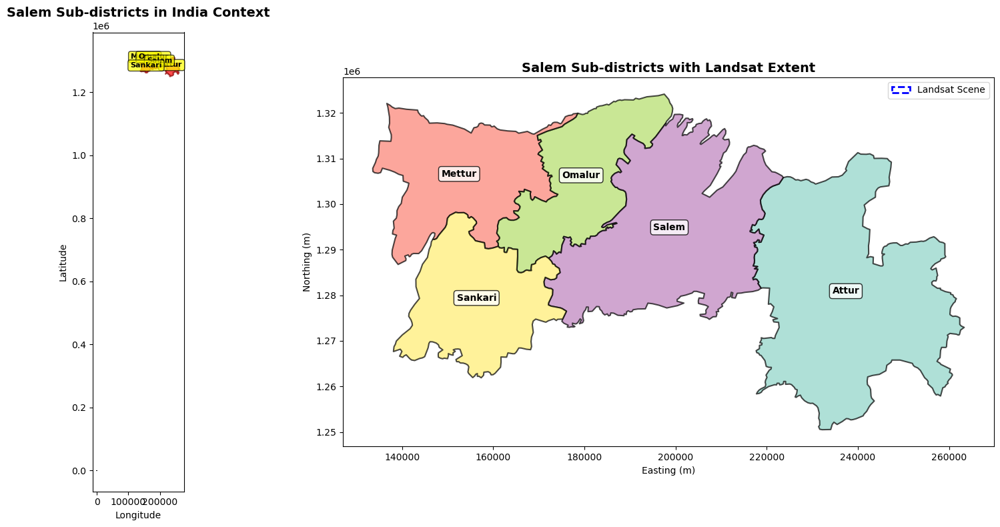

In [15]:
# VISUALIZE SHAPEFILE AND LANDSAT EXTENT
print("VISUALIZATION")
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot 1: All India with Salem highlighted
ax1 = axes[0]
gdf.plot(ax=ax1, color='lightgray', edgecolor='black', linewidth=0.5)
salem_subdistricts_proj.plot(ax=ax1, color='red', edgecolor='darkred', 
                               linewidth=1.5, alpha=0.7)
ax1.set_title('Salem Sub-districts in India Context', fontsize=14, fontweight='bold')
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')

# Add labels for Salem sub-districts
for idx, row in salem_subdistricts_proj.iterrows():
    centroid = row.geometry.centroid
    ax1.annotate(row[name_col], xy=(centroid.x, centroid.y), 
                ha='center', fontsize=8, fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

# Plot 2: Salem sub-districts zoomed with Landsat extent
ax2 = axes[1]
salem_subdistricts_proj.plot(ax=ax2, column=name_col, cmap='Set3', 
                              edgecolor='black', linewidth=1.5, 
                              legend=True, alpha=0.7)
# Overlay Landsat extent
from matplotlib.patches import Rectangle
landsat_rect = Rectangle((landsat_bounds[0], landsat_bounds[1]),
                          landsat_bounds[2] - landsat_bounds[0],
                          landsat_bounds[3] - landsat_bounds[1],
                          fill=False, edgecolor='blue', linewidth=2, 
                          linestyle='--', label='Landsat Scene')
ax2.add_patch(landsat_rect)

ax2.set_title('Salem Sub-districts with Landsat Extent', fontsize=14, fontweight='bold')
ax2.set_xlabel('Easting (m)')
ax2.set_ylabel('Northing (m)')
ax2.legend(loc='upper right')

# Add labels
for idx, row in salem_subdistricts_proj.iterrows():
    centroid = row.geometry.centroid
    ax2.annotate(row[name_col], xy=(centroid.x, centroid.y), 
                ha='center', fontsize=10, fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

In [16]:
# CROP LANDSAT BANDS TO SALEM REGION (FIXED)
print("CROPPING LANDSAT TO SALEM REGION")

# Merge all Salem sub-districts into one geometry
salem_region = salem_subdistricts_proj.geometry.unary_union

# Create a list of geometries for masking
geoms = [mapping(salem_region)]

# Crop each band
cropped_bands = {}
out_transform = None
out_shape = None

print("Cropping bands...")
for i in range(1, 8):
    band_file = base_path / f'{base_name}_SR_B{i}.TIF'
    
    with rio.open(band_file) as src:
        # Crop the raster (FIXED: removed fill_value parameter)
        out_image, out_transform = mask(src, geoms, crop=True, filled=False)
        out_meta = src.meta.copy()
        
        # Get the cropped data
        band_data = out_image[0].astype(np.float32)
        
        # Apply scaling to reflectance
        band_data = band_data * 0.0000275 - 0.2
        band_data = np.clip(band_data, 0, 1)
        
        # Set nodata values to NaN
        if src.nodata is not None:
            band_data[out_image[0] == src.nodata] = np.nan
        
        cropped_bands[f'B{i}'] = band_data
        out_shape = band_data.shape
        
    print(f"   B{i} cropped: {band_data.shape}")

# Also crop QA band
qa_file = base_path / f'{base_name}_QA_PIXEL.TIF'
with rio.open(qa_file) as src:
    qa_cropped, qa_transform = mask(src, geoms, crop=True, filled=False)
    qa_cropped = qa_cropped[0]

print(f"  QA band cropped: {qa_cropped.shape}")

CROPPING LANDSAT TO SALEM REGION
Cropping bands...


C:\Users\anitk\AppData\Local\Temp\ipykernel_11508\4273099200.py:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  salem_region = salem_subdistricts_proj.geometry.unary_union


   B1 cropped: (2455, 4327)
   B2 cropped: (2455, 4327)
   B3 cropped: (2455, 4327)
   B4 cropped: (2455, 4327)
   B5 cropped: (2455, 4327)
   B6 cropped: (2455, 4327)
   B7 cropped: (2455, 4327)
  QA band cropped: (2455, 4327)


In [17]:
# Apply quality mask
salem_valid_mask = extract_qa_bits(qa_cropped)

# Apply mask to all bands
for band_id in cropped_bands.keys():
    cropped_bands[band_id][~salem_valid_mask] = np.nan

print(f"\n Quality mask applied")
print(f"  Valid pixels: {np.sum(salem_valid_mask):,} ({np.sum(salem_valid_mask)/salem_valid_mask.size*100:.1f}%)")

# Stack cropped bands
salem_multispectral = np.stack([cropped_bands[f'B{i}'] for i in range(1, 8)], axis=0)

print(f"\n Salem region cropped successfully")
print(f"  Shape: {salem_multispectral.shape}")
print(f"  Coverage: {salem_multispectral.shape[1] * 30 / 1000:.1f} km × {salem_multispectral.shape[2] * 30 / 1000:.1f} km")

# Store the transform for later use
salem_transform = out_transform


 Quality mask applied
  Valid pixels: 5,794,980 (54.6%)

 Salem region cropped successfully
  Shape: (7, 2455, 4327)
  Coverage: 73.7 km × 129.8 km



Visualizing cropped Salem region...


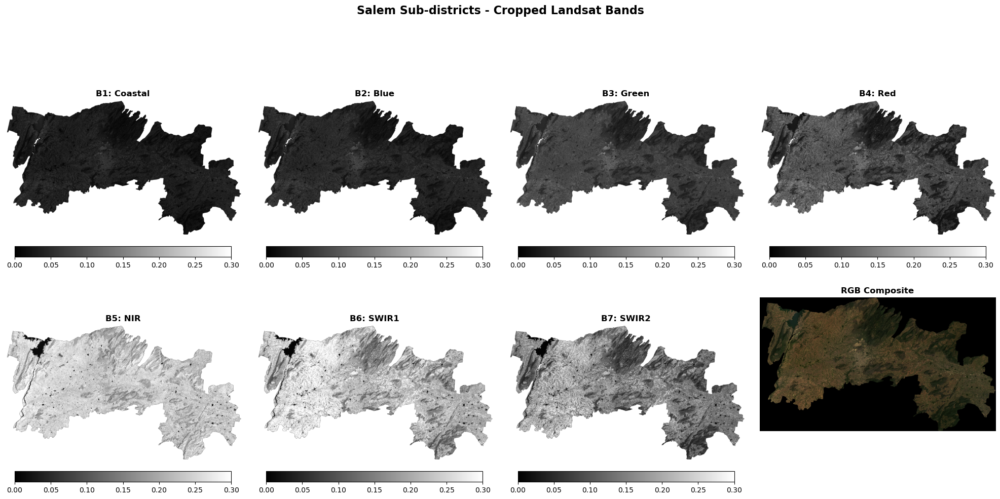


Salem cropped extent: [133545.0, 263355.0, 1250475.0, 1324125.0]


In [18]:
# VISUALIZE CROPPED REGION
print("\nVisualizing cropped Salem region...")

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

band_names = ['B1: Coastal', 'B2: Blue', 'B3: Green', 'B4: Red', 
              'B5: NIR', 'B6: SWIR1', 'B7: SWIR2']

for idx, (band_id, name) in enumerate(zip(cropped_bands.keys(), band_names)):
    ax = axes[idx]
    
    valid_array = np.ma.masked_invalid(cropped_bands[band_id])
    im = ax.imshow(valid_array, cmap='gray', vmin=0, vmax=0.3)
    
    ax.set_title(name, fontsize=12, fontweight='bold')
    ax.axis('off')
    
    plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, fraction=0.046)

# RGB composite
rgb_salem = np.stack([
    cropped_bands['B4'],  # Red
    cropped_bands['B3'],  # Green
    cropped_bands['B2']   # Blue
], axis=-1)

rgb_salem = np.nan_to_num(rgb_salem, nan=0.0)
rgb_salem_enhanced = np.clip(rgb_salem * 3, 0, 1)

axes[7].imshow(rgb_salem_enhanced)
axes[7].set_title('RGB Composite', fontsize=12, fontweight='bold')
axes[7].axis('off')

plt.suptitle('Salem Sub-districts - Cropped Landsat Bands', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# CREATE EXTENT FOR CROPPED REGION
# Calculate extent from transform and shape
salem_extent = [
    salem_transform[2],  # left
    salem_transform[2] + salem_transform[0] * out_shape[1],  # right
    salem_transform[5] + salem_transform[4] * out_shape[0],  # bottom
    salem_transform[5]   # top
]

print(f"\nSalem cropped extent: {salem_extent}")

In [19]:
# SAVE CROPPED DATA (FIXED)
print("SAVING CROPPED DATA")

# Convert masked arrays to regular numpy arrays before saving
# Fill masked values with NaN
salem_multispectral_save = np.array(salem_multispectral, dtype=np.float32)
salem_valid_mask_save = np.array(salem_valid_mask, dtype=bool)

# Save cropped multispectral array
np.save('salem_multispectral_cropped_8.npy', salem_multispectral_save)
np.save('salem_valid_mask_8.npy', salem_valid_mask_save)

print(" Arrays saved:")
print(f"  - salem_multispectral_cropped.npy ({salem_multispectral_save.nbytes / 1024**2:.2f} MB)")
print(f"  - salem_valid_mask.npy ({salem_valid_mask_save.nbytes / 1024**2:.2f} MB)")

# Save metadata
salem_metadata = {
    'shape': list(salem_multispectral.shape),
    'extent': salem_extent,
    'transform': [float(x) for x in salem_transform[:6]],
    'crs': str(landsat_crs),
    'subdistricts': salem_subdistricts_proj[name_col].tolist(),
    'valid_pixel_percentage': float(np.sum(salem_valid_mask) / salem_valid_mask.size * 100),
    'area_km2': float(salem_multispectral.shape[1] * salem_multispectral.shape[2] * 900 / 1e6)
}

with open('salem_metadata_8.json', 'w') as f:
    json.dump(salem_metadata, f, indent=2)

print(" Metadata saved: salem_metadata_8.json")


# Save shapefile subset [WE NEED THIS FILE]
salem_subdistricts_proj.to_file('salem_subdistricts_8.shp')

print(" Shapefile saved: salem_subdistricts_8.shp (and associated files)")


# SAVE AS GEOTIFF
print("\nSaving as GeoTIFF...")

# Update metadata for output
out_meta = {
    'driver': 'GTiff',
    'height': salem_multispectral.shape[1],
    'width': salem_multispectral.shape[2],
    'count': 7,  # 7 bands
    'dtype': 'float32',
    'crs': landsat_crs,
    'transform': salem_transform,
    'nodata': np.nan
}

# Save all bands as a single multi-band GeoTIFF
with rio.open('salem_multispectral_cropped_8.tif', 'w', **out_meta) as dst:
    for i in range(7):
        dst.write(salem_multispectral_save[i], i + 1)

print(" GeoTIFF saved: salem_multispectral_cropped_8.tif")

SAVING CROPPED DATA
 Arrays saved:
  - salem_multispectral_cropped.npy (283.66 MB)
  - salem_valid_mask.npy (10.13 MB)
 Metadata saved: salem_metadata_8.json
 Shapefile saved: salem_subdistricts_8.shp (and associated files)

Saving as GeoTIFF...
 GeoTIFF saved: salem_multispectral_cropped_8.tif


In [20]:
# Quick check before running PCA
print(f"salem_multispectral shape: {salem_multispectral.shape}")
print(f"salem_transform: {salem_transform}")
print(f"landsat_crs: {landsat_crs}")

salem_multispectral shape: (7, 2455, 4327)
salem_transform: | 30.00, 0.00, 133545.00|
| 0.00,-30.00, 1324125.00|
| 0.00, 0.00, 1.00|
landsat_crs: EPSG:32644


In [23]:
print("PCA FEATURE EXTRACTION - SALEM REGION")

# Verify data
n_bands, height, width = salem_multispectral.shape
print(f"\nSalem Data:")
print(f"  Shape: {salem_multispectral.shape}")
print(f"  Coverage: {height * 30 / 1000:.2f} km × {width * 30 / 1000:.2f} km")
print(f"  Total area: {(height * width * 900) / 1e6:.2f} km²")

# STEP 1: PREPARE DATA FOR PCA
print("\nPreparing data for PCA...")
X_2d = salem_multispectral.reshape(n_bands, -1).T
valid_mask_pca = ~np.isnan(X_2d).any(axis=1)
X_valid = X_2d[valid_mask_pca]

print(f"  Total pixels: {X_2d.shape[0]:,}")
print(f"  Valid pixels: {X_valid.shape[0]:,} ({X_valid.shape[0]/X_2d.shape[0]*100:.1f}%)")
print(f"  Invalid pixels: {(~valid_mask_pca).sum():,} ({(~valid_mask_pca).sum()/X_2d.shape[0]*100:.1f}%)")


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_valid)
print(f"   Data standardized (mean=0, std=1)")

# STEP 2: PERFORM PCA
print(f"\nPerforming PCA...")
pca = PCA(n_components=7)
pca_transformed = pca.fit_transform(X_scaled)
print(f"   PCA completed")

# PCA VARIANCE TABLE
print(f"PCA VARIANCE TABLE")
print(f"{'Component':<12} {'Variance':<18} {'Variance %':<15} {'Cumulative %':<15}")

cumulative_var = np.cumsum(pca.explained_variance_ratio_)
for i, (variance, var_ratio, cum_var) in enumerate(zip(pca.explained_variance_, 
                                                         pca.explained_variance_ratio_, 
                                                         cumulative_var), 1):
    print(f"PC{i:<10} {variance:>15.4f}   {var_ratio*100:>12.2f}%  {cum_var*100:>14.2f}%")


components_95 = int(np.argmax(cumulative_var >= 0.95) + 1)
print(f"\n💡 Components needed for 95% variance: {components_95}")

# STEP 3: RESHAPE TO IMAGE FORMAT (FIXED)
print("STEP 3: RESHAPE TO IMAGE FORMAT...")
# Create full image arrays with NaNs
pca_bands_salem = np.full((7, height, width), np.nan, dtype=np.float32)

# FIXED: Convert 1D valid_mask_pca to 2D height x width
valid_mask_2d = valid_mask_pca.reshape(height, width)

# Assign PCA components using 2D mask
for i in range(7):
    pca_bands_salem[i][valid_mask_2d] = pca_transformed[:, i]

print(f"  PCA bands shape: {pca_bands_salem.shape}")
print()

# Verify fix worked
print("VERIFICATION - PCA BAND STATS:")
for c in range(3):  # Check first 3 components
    band = pca_bands_salem[c]
    finite_vals = band[~np.isnan(band)]
    print(f"  PC{c+1}: min={finite_vals.min():.4f}, max={finite_vals.max():.4f}, "
          f"mean={finite_vals.mean():.4f}, std={finite_vals.std():.4f}")

PCA FEATURE EXTRACTION - SALEM REGION

Salem Data:
  Shape: (7, 2455, 4327)
  Coverage: 73.65 km × 129.81 km
  Total area: 9560.51 km²

Preparing data for PCA...
  Total pixels: 10,622,785
  Valid pixels: 5,794,980 (54.6%)
  Invalid pixels: 4,827,805 (45.4%)
   Data standardized (mean=0, std=1)

Performing PCA...
   PCA completed
PCA VARIANCE TABLE
Component    Variance           Variance %      Cumulative %   
PC1                   5.5962          79.95%           79.95%
PC2                   0.9008          12.87%           92.82%
PC3                   0.3408           4.87%           97.68%
PC4                   0.1260           1.80%           99.48%
PC5                   0.0152           0.22%           99.70%
PC6                   0.0133           0.19%           99.89%
PC7                   0.0076           0.11%          100.00%

💡 Components needed for 95% variance: 3
STEP 3: RESHAPE TO IMAGE FORMAT...
  PCA bands shape: (7, 2455, 4327)

VERIFICATION - PCA BAND STATS:
  PC1: m


Generating visualizations...


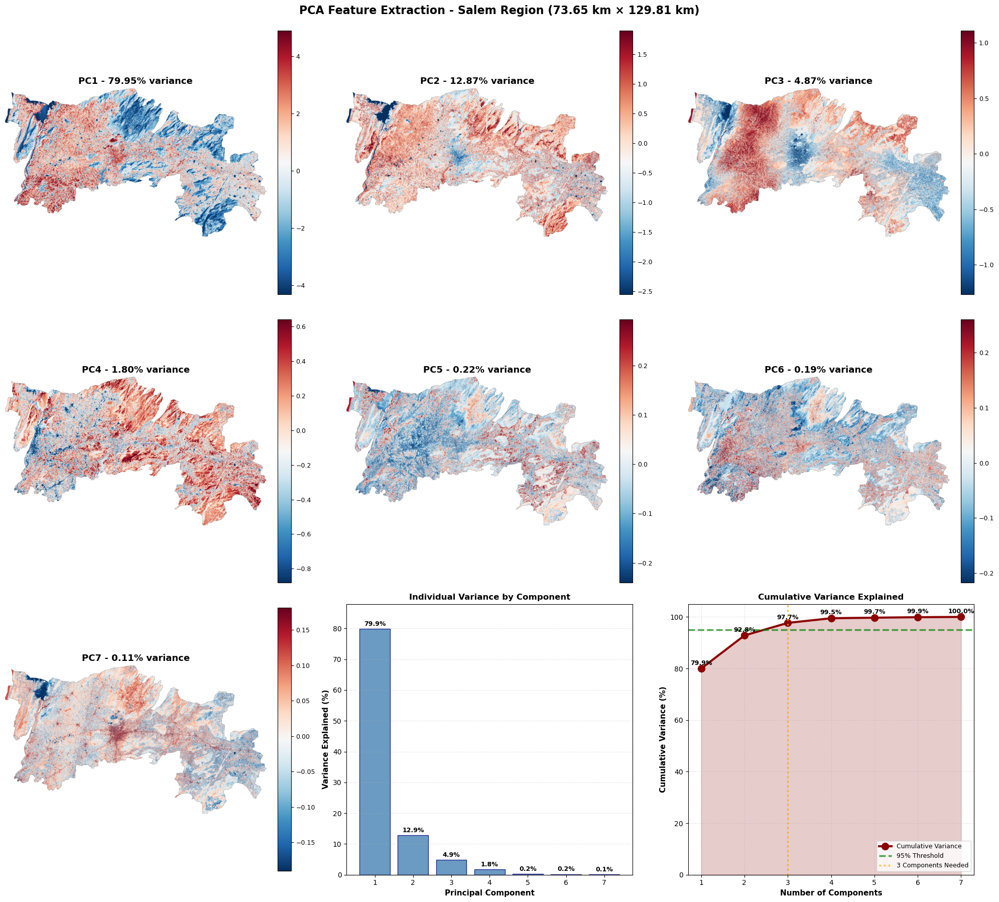


Creating PCA false color composites...


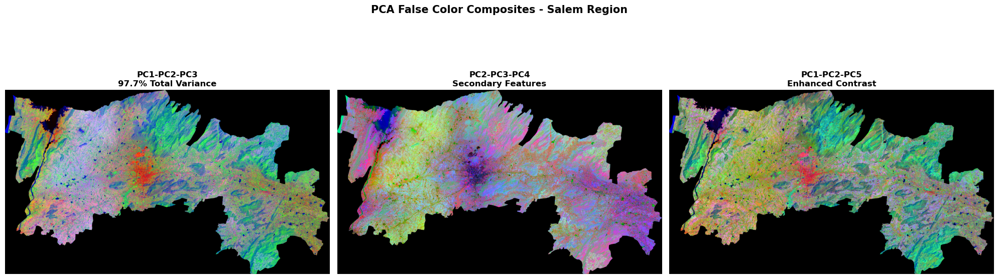

In [24]:
#PCA Variance Visualization
print("\nGenerating visualizations...")

# Main PCA bands visualization
fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes = axes.flatten()

for i in range(7):
    ax = axes[i]
    pc_data = pca_bands_salem[i]
    valid_data = pc_data[np.isfinite(pc_data)]
    
    if len(valid_data) > 100:
        vmin = np.percentile(valid_data, 2)
        vmax = np.percentile(valid_data, 98)
        im = ax.imshow(pc_data, cmap='RdBu_r', vmin=vmin, vmax=vmax)
        variance = pca.explained_variance_ratio_[i] * 100
        ax.set_title(f'PC{i+1} - {variance:.2f}% variance', 
                    fontsize=13, fontweight='bold')
        ax.axis('off')
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=9)

# Variance bar chart
ax = axes[7]
components_idx = np.arange(1, 8)
bars = ax.bar(components_idx, pca.explained_variance_ratio_ * 100, 
              color='steelblue', alpha=0.8, edgecolor='navy')
ax.set_xlabel('Principal Component', fontsize=11, fontweight='bold')
ax.set_ylabel('Variance Explained (%)', fontsize=11, fontweight='bold')
ax.set_title('Individual Variance by Component', fontsize=12, fontweight='bold')
ax.set_xticks(components_idx)
ax.grid(True, alpha=0.3, axis='y', linestyle='--')
ax.set_ylim(0, max(pca.explained_variance_ratio_) * 110)

# Add value labels on bars
for bar, var in zip(bars, pca.explained_variance_ratio_):
    height_bar = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height_bar + 0.5,
            f'{var*100:.1f}%', ha='center', va='bottom', 
            fontsize=9, fontweight='bold')

# Cumulative variance plot
ax = axes[8]
cumsum = cumulative_var * 100
line = ax.plot(components_idx, cumsum, 'o-', linewidth=3, markersize=10, 
               color='darkred', label='Cumulative Variance')[0]
ax.axhline(y=95, color='green', linestyle='--', linewidth=2.5, 
           label='95% Threshold', alpha=0.7)
ax.axvline(x=components_95, color='orange', linestyle=':', linewidth=2.5,
           label=f'{components_95} Components Needed', alpha=0.7)
ax.fill_between(components_idx, cumsum, alpha=0.2, color='darkred')
ax.set_xlabel('Number of Components', fontsize=11, fontweight='bold')
ax.set_ylabel('Cumulative Variance (%)', fontsize=11, fontweight='bold')
ax.set_title('Cumulative Variance Explained', fontsize=12, fontweight='bold')
ax.set_xticks(components_idx)
ax.set_ylim(0, 105)
ax.legend(fontsize=9, loc='lower right')
ax.grid(True, alpha=0.3, linestyle='--')

# Add value labels
for comp, cum in zip(components_idx, cumsum):
    ax.text(comp, cum + 1.5, f'{cum:.1f}%', ha='center', 
            fontsize=9, fontweight='bold')

plt.suptitle('PCA Feature Extraction - Salem Region (73.65 km × 129.81 km)', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

#  PCA FALSE COLOR COMPOSITES
print("\nCreating PCA false color composites...")

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

composites = [
    ([0, 1, 2], 'PC1-PC2-PC3', f'{cumsum[2]:.1f}% Total Variance'),
    ([1, 2, 3], 'PC2-PC3-PC4', 'Secondary Features'),
    ([0, 1, 4], 'PC1-PC2-PC5', 'Enhanced Contrast')
]

for idx, (pcs, title, subtitle) in enumerate(composites):
    ax = axes[idx]
    rgb_pca = np.stack([pca_bands_salem[pc] for pc in pcs], axis=-1)
    
    # Normalize each channel
    for i in range(3):
        valid = rgb_pca[:, :, i][np.isfinite(rgb_pca[:, :, i])]
        if len(valid) > 0:
            vmin, vmax = np.percentile(valid, [2, 98])
            rgb_pca[:, :, i] = np.clip((rgb_pca[:, :, i] - vmin) / (vmax - vmin), 0, 1)
    
    rgb_pca = np.nan_to_num(rgb_pca, nan=0)
    ax.imshow(rgb_pca)
    ax.set_title(f'{title}\n{subtitle}', fontsize=12, fontweight='bold')
    ax.axis('off')

plt.suptitle('PCA False Color Composites - Salem Region', 
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

In [26]:
print("SAVING PCA RESULTS (First 3 Components Only)")

# Save compressed NPZ - Only first 3 PCA bands
np.savez_compressed(
    'salem_pca_top3_bands_8.npz',
    pca_bands=pca_bands_salem[:3],  # Only first 3 components
    explained_variance_ratio=pca.explained_variance_ratio_[:3],
    cumulative_variance=cumulative_var[:3],
    components=pca.components_[:3],  # Only first 3 component vectors
    mean=scaler.mean_,
    scale=scaler.scale_
)
print("\n Saved: salem_pca_top3_bands_8.npz")

# Save individual PC bands as GeoTIFF - Only PC1, PC2, PC3
profile_pc = {
    'driver': 'GTiff',
    'dtype': 'float32',
    'count': 1,
    'height': height,
    'width': width,
    'crs': landsat_crs,
    'transform': salem_transform,
    'nodata': np.nan,
    'compress': 'lzw'
}

print("\nSaving individual GeoTIFF files:")
for i in range(3):  # Changed from range(7) to range(3)
    output_file = f'salem_PC{i+1}.tif'
    with rio.open(output_file, 'w', **profile_pc) as dst:
        dst.write(pca_bands_salem[i].astype(np.float32), 1)
    print(f"   {output_file}")

# Save metadata
pca_metadata = {
    'region': 'Salem District (Attur, Mettur, Omalur, Salem, Sankari)',
    'n_components': 3,  # Changed from 7 to 3
    'note': 'Only top 3 PCA components saved (capturing 95%+ variance)',
    'image_dimensions': {
        'bands': 3,  # Changed from n_bands to 3
        'height': int(height),
        'width': int(width),
        'total_pixels': int(height * width),
        'coverage_km': {
            'height': float(height * 30 / 1000),
            'width': float(width * 30 / 1000),
            'area': float((height * width * 900) / 1e6)
        }
    },
    'data_statistics': {
        'total_pixels': int(X_2d.shape[0]),
        'valid_pixels': int(X_valid.shape[0]),
        'invalid_pixels': int((~valid_mask_pca).sum()),
        'valid_percentage': float(X_valid.shape[0] / X_2d.shape[0] * 100)
    },
    'pca_results': {
        'explained_variance_ratio': [float(v) for v in pca.explained_variance_ratio_[:3]],  # Only first 3
        'cumulative_variance': [float(v) for v in cumulative_var[:3]],  # Only first 3
        'components_for_95_percent': int(components_95),
        'total_variance_captured_by_top3': float(cumulative_var[2]),  # Variance captured by PC1-PC3
        'full_model_variance': float(cumulative_var[-1])  # Total variance if all 7 were used
    },
    'standardized': True,
    'geospatial': {
        'crs': str(landsat_crs),
        'transform': [float(x) for x in salem_transform[:6]],
        'bounds': {
            'left': float(salem_transform[2]),
            'top': float(salem_transform[5]),
            'right': float(salem_transform[2] + width * salem_transform[0]),
            'bottom': float(salem_transform[5] + height * salem_transform[4])
        }
    }
}

with open('salem_pca_top3_bands_8.json', 'w') as f:
    json.dump(pca_metadata, f, indent=2)
print(" Saved: salem_pca_top3_bands_8.json")

SAVING PCA RESULTS (First 3 Components Only)

 Saved: salem_pca_top3_bands_8.npz

Saving individual GeoTIFF files:
   salem_PC1.tif
   salem_PC2.tif
   salem_PC3.tif
 Saved: salem_pca_top3_bands_8.json


In [5]:
landsat_ref = "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B5.tif"  

with rio.open(landsat_ref) as src:
    landsat_meta = src.meta.copy()
    landsat_transform = src.transform
    landsat_crs = src.crs
    landsat_shape = (src.height, src.width)

lithology_gdf = gpd.read_file("Lithology.shp")

print("Lithology CRS:", lithology_gdf.crs)
print("Landsat CRS:", landsat_crs)

Lithology CRS: EPSG:4326
Landsat CRS: EPSG:32644


In [6]:
salem_gdf = gpd.read_file("salem_subdistricts_8.shp")

salem_gdf = salem_gdf.to_crs(lithology_gdf.crs)

# Cliping
lithology_salem = gpd.clip(lithology_gdf, salem_gdf)

print("Original polygons:", len(lithology_gdf))
print("After Salem crop:", len(lithology_salem))

print(lithology_salem.nunique())

Original polygons: 38256
After Salem crop: 1238
OBJECTID      1238
INPUT_CENT       1
TOPOSHEET_      16
EDITION_NU       0
GEOMETRY_I       0
AGE              6
SUPERGROUP       2
GROUP_NAME       8
FORMATION        1
MEMBER           0
LITHOLOGIC      34
SUB_GROUP        0
NEW_GEOM_I      39
UID_NOTATI      39
INTRUSIVE        5
SCRIPT          39
NOTATION        39
STRATIGRAP      39
AREA             0
AREA1            0
NOTATION12       0
geometry      1238
dtype: int64


In [7]:
print("Before clip:", lithology_gdf["LITHOLOGIC"].nunique())
print("After clip:", lithology_salem["LITHOLOGIC"].nunique())

Before clip: 212
After clip: 34


In [8]:
# Load lithology shapefile
#litho_gdf = gpd.read_file("Lithology.shp")

# Open reference raster (PCA1)
ref = rio.open("salem_PC1.tif")

meta = ref.meta.copy()
meta.update({
    "count": 1,
    "dtype": "float32"
})

lithology_salem = lithology_salem.to_crs(ref.crs)

In [66]:
lithology_salem["lith_code"] = lithology_salem["LITHOLOGIC"].astype("category").cat.codes
print(lithology_salem["LITHOLOGIC"].nunique())
lithology_salem["intr_code"] = lithology_salem["INTRUSIVE"].astype("category").cat.codes
print(lithology_salem["INTRUSIVE"].nunique())
lithology_salem["age_code"]  = lithology_salem["AGE"].astype("category").cat.codes
print(lithology_salem["AGE"].nunique())
lithology_salem["grp_code"]  = lithology_salem["GROUP_NAME"].astype("category").cat.codes
print(lithology_salem["GROUP_NAME"].nunique())

34
5
6
8


In [13]:
def safe_encode(series, feature_name):
    nan_count = series.isna().sum()
    codes = series.astype("category").cat.codes   # NaN → -1, valid → 0,1,2,...
    codes = codes + 1                             # NaN → 0,  valid → 1,2,3,...
    codes = codes.clip(lower=0)                   # safety floor

    valid_cats = series.dropna().nunique()
    print(f"\n{feature_name}:")
    print(f"  Shapefile NaN polygons : {nan_count}  "
          f"({'these map to 0, same as fill' if nan_count > 0 else 'none — clean'})")
    print(f"  Valid categories       : {valid_cats}")
    print(f"  Final codes            : 0 = no-data/NaN  |  1–{codes.max()} = valid categories")
    print(f"  Code range             : [{codes.min()}, {codes.max()}]  ← no negatives ✓")
    return codes

lithology_salem["lith_code"] = safe_encode(lithology_salem["LITHOLOGIC"], "LITHOLOGIC")
lithology_salem["intr_code"] = safe_encode(lithology_salem["INTRUSIVE"],  "INTRUSIVE")
lithology_salem["age_code"]  = safe_encode(lithology_salem["AGE"],        "AGE")
lithology_salem["grp_code"]  = safe_encode(lithology_salem["GROUP_NAME"], "GROUP_NAME")

print("\n" + "═"*50)
print("ENCODING SUMMARY")
print("═"*50)
summary = {
    "LITHOLOGIC" : lithology_salem["lith_code"],
    "INTRUSIVE"  : lithology_salem["intr_code"],
    "AGE"        : lithology_salem["age_code"],
    "GROUP_NAME" : lithology_salem["grp_code"],
}
for name, codes in summary.items():
    has_neg = (codes < 0).any()
    print(f"  {name:<15} | range [{codes.min()}, {codes.max()}] "
          f"| {codes.nunique()} unique codes "
          f"| negatives={'YES ✗' if has_neg else 'none ✓'}")
print("\n✓ All features encoded. Ready for rasterization.")


LITHOLOGIC:
  Shapefile NaN polygons : 0  (none — clean)
  Valid categories       : 34
  Final codes            : 0 = no-data/NaN  |  1–34 = valid categories
  Code range             : [1, 34]  ← no negatives ✓

INTRUSIVE:
  Shapefile NaN polygons : 874  (these map to 0, same as fill)
  Valid categories       : 5
  Final codes            : 0 = no-data/NaN  |  1–5 = valid categories
  Code range             : [0, 5]  ← no negatives ✓

AGE:
  Shapefile NaN polygons : 0  (none — clean)
  Valid categories       : 6
  Final codes            : 0 = no-data/NaN  |  1–6 = valid categories
  Code range             : [1, 6]  ← no negatives ✓

GROUP_NAME:
  Shapefile NaN polygons : 365  (these map to 0, same as fill)
  Valid categories       : 8
  Final codes            : 0 = no-data/NaN  |  1–8 = valid categories
  Code range             : [0, 8]  ← no negatives ✓

══════════════════════════════════════════════════
ENCODING SUMMARY
══════════════════════════════════════════════════
  LITHOLOGIC 

In [14]:
def rasterize_feature(gdf, value_column, ref):
    
    shapes = ((geom, value) for geom, value in zip(gdf.geometry, gdf[value_column]))
    
    raster = rasterize(
        shapes=shapes,
        out_shape=(ref.height, ref.width),
        transform=ref.transform,
        fill=0,
        dtype="float32"
    )
    
    return raster

In [15]:
lithology_raster = rasterize_feature(lithology_salem, "lith_code", ref)
intrusive_raster = rasterize_feature(lithology_salem, "intr_code", ref)
age_raster       = rasterize_feature(lithology_salem, "age_code", ref)
group_raster     = rasterize_feature(lithology_salem, "grp_code", ref)

In [16]:
with rio.open("LITHOLOGIC.tif", "w", **meta) as dst:
    dst.write(lithology_raster, 1)

with rio.open("INTRUSIVE.tif", "w", **meta) as dst:
    dst.write(intrusive_raster, 1)

with rio.open("AGE.tif", "w", **meta) as dst:
    dst.write(age_raster, 1)

with rio.open("GROUP_NAME.tif", "w", **meta) as dst:
    dst.write(group_raster, 1)

In [82]:
FAULT_2M_gdf = gpd.read_file("FAULT_2M.shp")

print("FAULT_2M CRS:", FAULT_2M_gdf.crs)
print("Landsat CRS:", landsat_crs)

FAULT_2M_gdf = FAULT_2M_gdf.to_crs(ref.crs)

FAULT_2M CRS: EPSG:4326
Landsat CRS: EPSG:32644


In [83]:
salem_gdf = salem_gdf.to_crs(ref.crs)

FAULT_2M_salem = gpd.clip(FAULT_2M_gdf, salem_gdf)

print("Original:", len(FAULT_2M_gdf))
print("After Salem crop:", len(FAULT_2M_salem))

print(FAULT_2M_salem.nunique())

Original: 15
After Salem crop: 1
OBJECTID      1
FNODE_        1
TNODE_        1
LPOLY_        1
RPOLY_        1
LENGTH        1
FAULTPJ_      1
FAULTPJ_ID    1
NAME          1
geometry      1
dtype: int64


In [77]:
fault_shapes = ((geom, 1) for geom in FAULT_2M_salem.geometry)

fault_raster = rasterize(
    shapes=fault_shapes,
    out_shape=(ref.height, ref.width),
    transform=ref.transform,
    fill=0,
    dtype="uint8"
)

In [84]:
from scipy.ndimage import distance_transform_edt

distance_raster = distance_transform_edt(fault_raster == 0)

In [85]:
pixel_size = ref.res[0]  # assuming square pixels

distance_raster = distance_raster * pixel_size

In [86]:
distance_raster = distance_raster / np.max(distance_raster)

In [87]:
meta.update(dtype="float32")

with rio.open("DISTANCE_TO_FAULT.tif", "w", **meta) as dst:
    dst.write(distance_raster.astype("float32"), 1)

In [89]:
np.min(distance_raster), np.max(distance_raster)

(np.float64(0.0), np.float64(1.0))

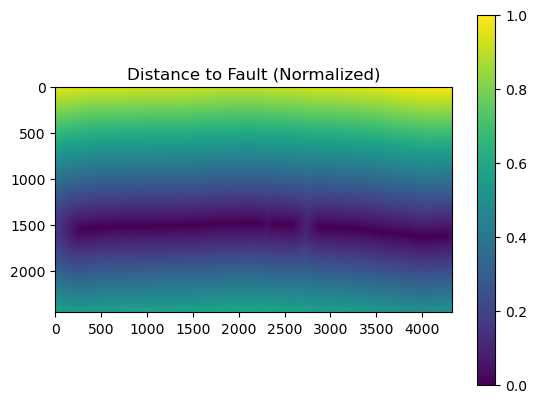

In [88]:
plt.imshow(distance_raster)
plt.colorbar()
plt.title("Distance to Fault (Normalized)")
plt.show()

### So now I have features
1. RAW BANDS [7 Channels]
2. PCA top3 [3 Channels]
3. Lithology (Salem only) [1 Channels]
4. Intrusive (Salem only) [1 Channels]
5. Age (Salem only) [1 Channels]
6. Group (Salem only) [1 Channels]
7. Distance_to_fault (Salem only) [1 Channels]

In [17]:
# ── Reference: the raw bands array
raw = np.load("salem_multispectral_cropped_8.npy")  # shape (7, H, W)
ref_H, ref_W = raw.shape[1], raw.shape[2]

GEO_TIFS = {
    "LITHOLOGIC":       "LITHOLOGIC.tif",
    "INTRUSIVE":        "INTRUSIVE.tif",
    "AGE":              "AGE.tif",
    "GROUP_NAME":       "GROUP_NAME.tif",
    "DISTANCE_FAULT":   "DISTANCE_TO_FAULT.tif",
}

with rio.open("salem_PC1.tif") as ref:
    ref_transform = ref.transform
    ref_crs       = ref.crs

print(f"Expected shape : ({ref_H}, {ref_W})")
print(f"Expected CRS   : {ref_crs}")
print(f"Expected transform: {ref_transform}\n")

all_ok = True
for name, path in GEO_TIFS.items():
    with rio.open(path) as src:
        arr = src.read(1)
        shape_ok     = (src.height == ref_H) and (src.width == ref_W)
        crs_ok       = src.crs == ref_crs
        transform_ok = src.transform == ref_transform
        has_data     = np.unique(arr[arr > 0]).size > 0   # non-zero values exist
        no_all_zeros = arr.max() > 0

        status = "✓ OK" if (shape_ok and crs_ok and transform_ok and has_data) else "✗ PROBLEM"
        all_ok &= (shape_ok and crs_ok and transform_ok and has_data)

        print(f"{name:<20} {status}")
        print(f"  Shape      : ({src.height}, {src.width}) — match={shape_ok}")
        print(f"  CRS        : {src.crs} — match={crs_ok}")
        print(f"  Transform  : match={transform_ok}")
        print(f"  Value range: [{arr.min():.4f}, {arr.max():.4f}]")
        print(f"  Unique vals: {np.unique(arr).size}  (0 = fill/outside)")
        print()

print("═" * 50)
print("OVERALL:", "✓ ALL FILES CORRECT" if all_ok else "✗ ISSUES FOUND — see above")

Expected shape : (2455, 4327)
Expected CRS   : EPSG:32644
Expected transform: | 30.00, 0.00, 133545.00|
| 0.00,-30.00, 1324125.00|
| 0.00, 0.00, 1.00|

LITHOLOGIC           ✓ OK
  Shape      : (2455, 4327) — match=True
  CRS        : EPSG:32644 — match=True
  Transform  : match=True
  Value range: [0.0000, 34.0000]
  Unique vals: 35  (0 = fill/outside)

INTRUSIVE            ✓ OK
  Shape      : (2455, 4327) — match=True
  CRS        : EPSG:32644 — match=True
  Transform  : match=True
  Value range: [0.0000, 5.0000]
  Unique vals: 6  (0 = fill/outside)

AGE                  ✓ OK
  Shape      : (2455, 4327) — match=True
  CRS        : EPSG:32644 — match=True
  Transform  : match=True
  Value range: [0.0000, 6.0000]
  Unique vals: 7  (0 = fill/outside)

GROUP_NAME           ✓ OK
  Shape      : (2455, 4327) — match=True
  CRS        : EPSG:32644 — match=True
  Transform  : match=True
  Value range: [0.0000, 8.0000]
  Unique vals: 9  (0 = fill/outside)

DISTANCE_FAULT       ✓ OK
  Shape     

Minerals CRS: EPSG:4326
Landsat CRS: EPSG:32644


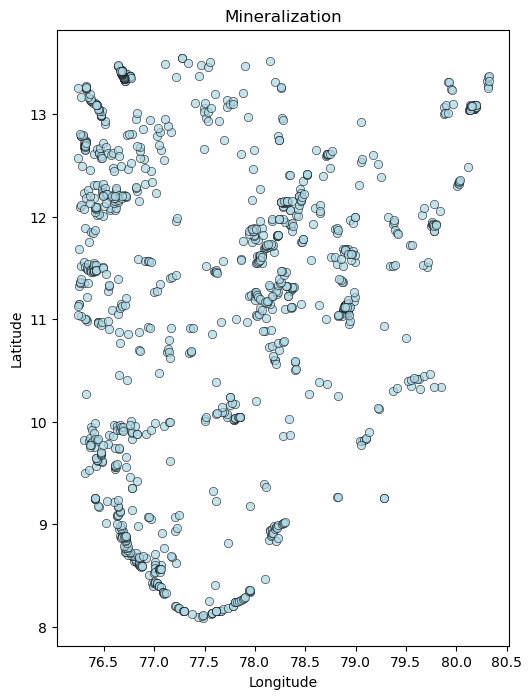

In [90]:
landsat_ref = "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B5.tif"

with rio.open(landsat_ref) as src:
    landsat_meta = src.meta.copy()
    landsat_shape = (src.height, src.width)

Minerals_shp = "Mineralization.shp"
Minerals_gdf = gpd.read_file(Minerals_shp)

print("Minerals CRS:", Minerals_gdf.crs)
print("Landsat CRS:", landsat_crs)

# Customized plot
fig, ax = plt.subplots(figsize=(12, 8))
Minerals_gdf.plot(ax=ax, 
         color='lightblue', 
         edgecolor='black', 
         linewidth=0.5,
         alpha=0.7)
plt.title('Mineralization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [94]:
if Minerals_gdf.crs != landsat_crs:
    Minerals_gdf = Minerals_gdf.to_crs(landsat_crs)

PIXEL_SIZE = abs(landsat_transform.a)   # ≈ 30 m
BUFFER_SIZE = PIXEL_SIZE * 3             # 60 m

Minerals_gdf_buffered = Minerals_gdf.copy()
Minerals_gdf_buffered["geometry"] = Minerals_gdf_buffered.geometry.buffer(BUFFER_SIZE)

shapes = [(geom, 1) for geom in Minerals_gdf_buffered.geometry]

Minerals_mask = rasterize(
    shapes=shapes,
    out_shape=landsat_shape,
    transform=landsat_transform,
    fill=0,
    dtype="uint8",
    all_touched=True   # VERY IMPORTANT
)

print("Unique values:", np.unique(Minerals_mask))

Unique values: [0 1]


 Minerals_gdf GT raster created: Minerals_GT_Mask_8.tif


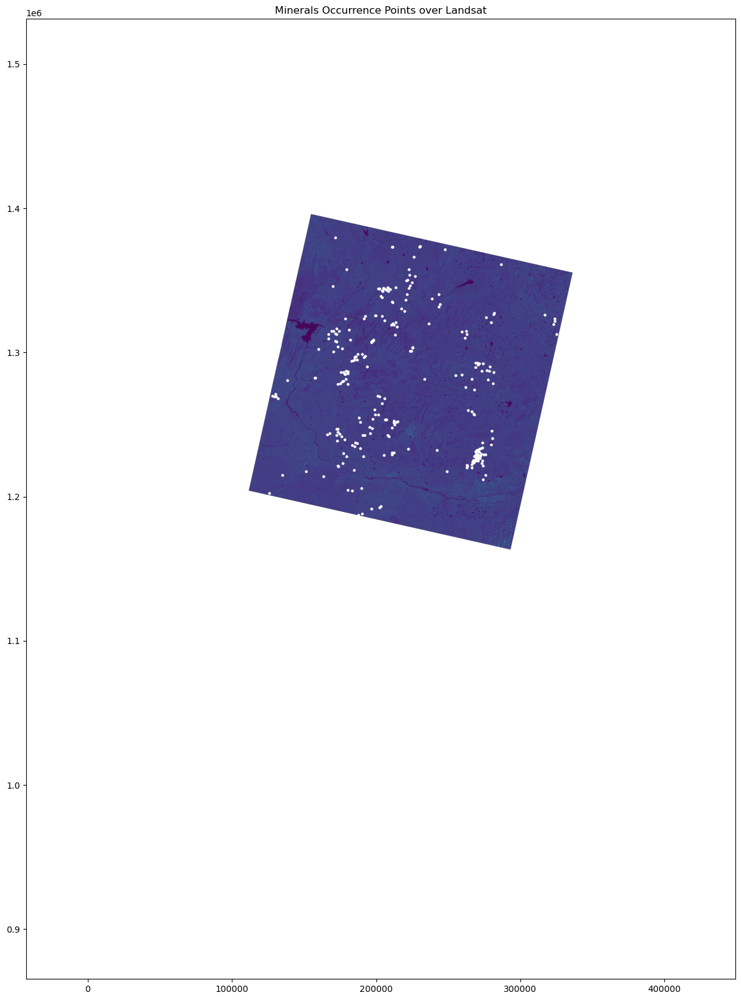

In [95]:
landsat_meta.update({
    "count": 1,
    "dtype": "uint8",
    "nodata": 0
})

output_gt = "Minerals_GT_Mask_8.tif"

with rio.open(output_gt, "w", **landsat_meta) as dst:
    dst.write(Minerals_mask, 1)

print(" Minerals_gdf GT raster created:", output_gt)

with rio.open(landsat_ref) as src:
    fig, ax = plt.subplots(figsize=(20,20))
    show(src, ax=ax)

    Minerals_gdf.plot(
        ax=ax,
        color="white",
        markersize=5,
        marker="o"
    )

    ax.set_title("Minerals Occurrence Points over Landsat")
    plt.show()

In [96]:
with rio.open(landsat_ref) as src:
    landsat_nodata = src.nodata
    landsat_band = src.read(1)

binary_gt = np.ones_like(landsat_band, dtype=np.uint8)
binary_gt[landsat_band == landsat_nodata] = 0

salem_shp = "salem_subdistricts_8.shp"
salem_gdf = gpd.read_file(salem_shp)

# landsat_crs is already defined above — no need to re-open the file
if salem_gdf.crs != landsat_crs:
    salem_gdf = salem_gdf.to_crs(landsat_crs)

salem_geom = [salem_gdf.geometry.union_all()]

In [97]:
def crop_raster(input_raster, output_raster, crop_geom):
    with rio.open(input_raster) as src:
        cropped_img, cropped_transform = mask(
            src,
            crop_geom,
            crop=True
        )

        cropped_meta = src.meta.copy()
        cropped_meta.update({
            "height": cropped_img.shape[1],
            "width": cropped_img.shape[2],
            "transform": cropped_transform
        })

        with rio.open(output_raster, "w", **cropped_meta) as dst:
            dst.write(cropped_img)

In [98]:
landsat_bands_list = [
    "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B2.tif",
    "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B3.tif",
    "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B4.tif",
    "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B5.tif",
    "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B6.tif",
    "LC08_L2SP_143052_20230213_20230218_02_T1_SR_B7.tif"
]

os.makedirs("Salem_Landsat", exist_ok=True)

for band in landsat_bands_list:
    out_path = os.path.join("Salem_Landsat", f"Salem_{band}")
    crop_raster(band, out_path, salem_geom)
    print("Cropped:", out_path)

Cropped: Salem_Landsat\Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B2.tif
Cropped: Salem_Landsat\Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B3.tif
Cropped: Salem_Landsat\Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B4.tif
Cropped: Salem_Landsat\Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B5.tif
Cropped: Salem_Landsat\Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B6.tif
Cropped: Salem_Landsat\Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B7.tif


In [99]:
gt_input = "Minerals_GT_Mask_8.tif"
gt_output = "Salem_Minerals_GT_Mask_8.tif"

crop_raster(gt_input, gt_output, salem_geom)

print(" Cropped GT saved:", gt_output)

with rio.open("Salem_Landsat/Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B5.tif") as lsrc, \
     rio.open("Salem_Minerals_GT_Mask_8.tif") as gtsrc:

    print("Same shape:", lsrc.shape == gtsrc.shape)
    print("Same transform:", lsrc.transform == gtsrc.transform)
    print("Same CRS:", lsrc.crs == gtsrc.crs)

 Cropped GT saved: Salem_Minerals_GT_Mask_8.tif
Same shape: True
Same transform: True
Same CRS: True


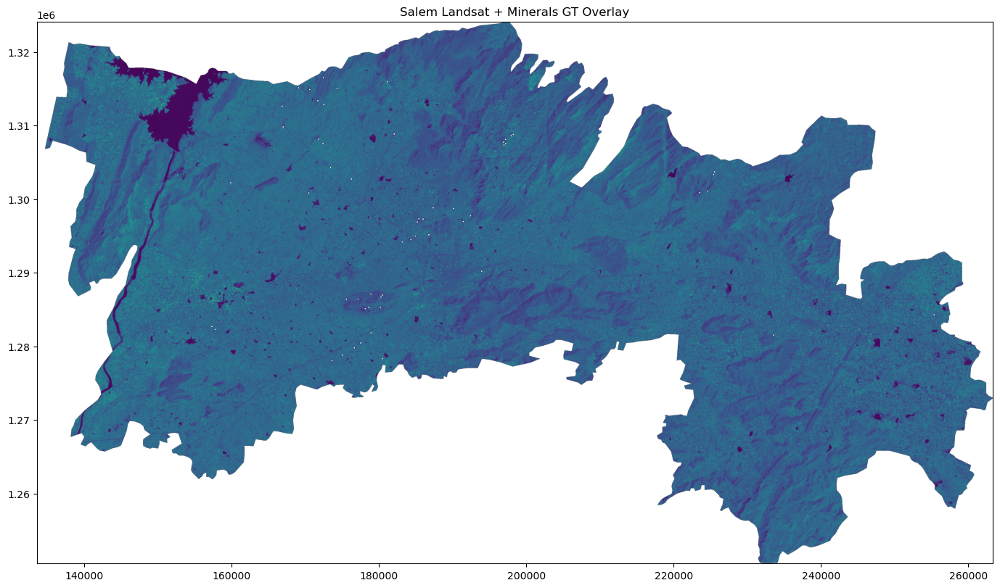

In [100]:
with rio.open("Salem_Landsat/Salem_LC08_L2SP_143052_20230213_20230218_02_T1_SR_B5.tif") as src:
    fig, ax = plt.subplots(figsize=(17,17))
    show(src, ax=ax)
    with rio.open("Salem_Minerals_GT_Mask_8.tif") as gt:
        show(gt, ax=ax, cmap="Reds", alpha=1.0)
    plt.title("Salem Landsat + Minerals GT Overlay")
    plt.show()

In [101]:
# =============================================================================
# STEP 1: LOAD GROUND TRUTH MASK
# =============================================================================

print("Loading Ground Truth Mask...")

# Load the ground truth mask
gt_path = 'Salem_Minerals_GT_Mask_8.tif'
with rio.open(gt_path) as src:
    gt_mask = src.read(1)  # Read first band
    gt_transform = src.transform
    gt_crs = src.crs
    gt_profile = src.profile

print(f"✓ Ground truth loaded")
print(f"  Shape: {gt_mask.shape}")
print(f"  CRS: {gt_crs}")
print(f"  Data type: {gt_mask.dtype}")

Loading Ground Truth Mask...
✓ Ground truth loaded
  Shape: (2455, 4327)
  CRS: EPSG:32644
  Data type: uint8


In [102]:
# =============================================================================
# STEP 2: CREATE BINARY LABELS
# =============================================================================

print("\nCreating Binary Labels...")

# Convert to binary
binary_labels = (gt_mask > 0).astype(np.uint8)

# ---------------------------------------------------------
# REMOVE INVALID PIXELS
# ---------------------------------------------------------

# Create valid mask from multispectral image
valid_mask = ~np.isnan(salem_multispectral).any(axis=0)

# Apply valid mask
binary_labels_valid = binary_labels[valid_mask]

print("✓ Binary labels created (invalid pixels removed)")

print(f"  Minerals pixels (1): {np.sum(binary_labels_valid == 1):,}")
print(f"  Non-Minerals pixels (0): {np.sum(binary_labels_valid == 0):,}")
print(f"  Minerals percentage: {np.mean(binary_labels_valid)*100:.4f}%")


Creating Binary Labels...
✓ Binary labels created (invalid pixels removed)
  Minerals pixels (1): 2,309
  Non-Minerals pixels (0): 5,792,671
  Minerals percentage: 0.0398%


In [105]:
# =============================================================================
# STEP 3: VERIFY SPATIAL ALIGNMENT WITH LANDSAT BANDS
# =============================================================================

print("\nVerifying Alignment with Landsat Bands...")

# Load cropped Salem multispectral data
landsat_path = 'salem_multispectral_cropped_8.npy'
landsat_bands = np.load(landsat_path)

print(f" Landsat data loaded")
print(f"  Landsat shape: {landsat_bands.shape}")  # Should be (7, height, width)
print(f"  GT mask shape: {gt_mask.shape}")        # Should be (height, width)

# Check if dimensions match
landsat_h, landsat_w = landsat_bands.shape[1], landsat_bands.shape[2]
gt_h, gt_w = gt_mask.shape

if landsat_h == gt_h and landsat_w == gt_w:
    print(" ALIGNMENT VERIFIED: Dimensions match perfectly!")
    aligned = True
else:
    print(f"⚠ WARNING: Dimension mismatch!")
    print(f"  Landsat: {landsat_h} × {landsat_w}")
    print(f"  GT mask: {gt_h} × {gt_w}")
    aligned = False


Verifying Alignment with Landsat Bands...
 Landsat data loaded
  Landsat shape: (7, 2455, 4327)
  GT mask shape: (2455, 4327)
 ALIGNMENT VERIFIED: Dimensions match perfectly!



Generating Visualization...
✓ Visualization saved: label_preparation_verification.png


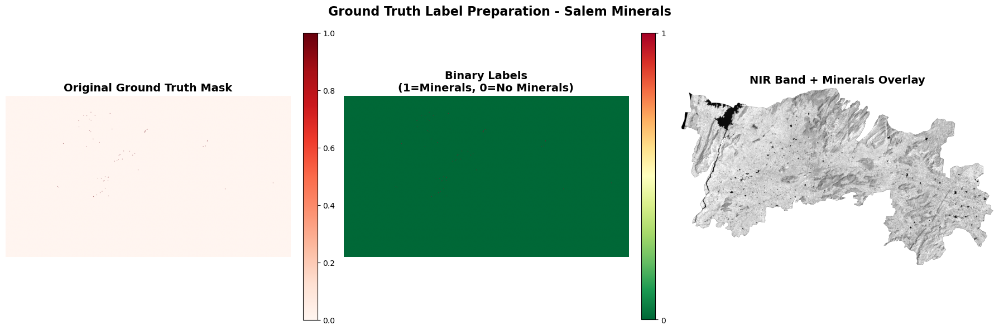

In [104]:
# =============================================================================
# STEP 4: VISUALIZE LABELS
# =============================================================================

print("\nGenerating Visualization...")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot 1: Ground Truth Mask (original values)
ax1 = axes[0]
im1 = ax1.imshow(gt_mask, cmap='Reds')
ax1.set_title('Original Ground Truth Mask', fontsize=14, fontweight='bold')
ax1.axis('off')
plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

# Plot 2: Binary Labels
ax2 = axes[1]
im2 = ax2.imshow(binary_labels, cmap='RdYlGn_r', vmin=0, vmax=1)
ax2.set_title('Binary Labels\n(1=Minerals, 0=No Minerals)', fontsize=14, fontweight='bold')
ax2.axis('off')
plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04, ticks=[0, 1])

# Plot 3: Overlay on Landsat Band 5 (NIR)
ax3 = axes[2]
if aligned:
    # Show NIR band with GT overlay
    nir_band = landsat_bands[4]  # Band 5 (index 4)
    nir_valid = np.ma.masked_invalid(nir_band)
    ax3.imshow(nir_valid, cmap='gray', vmin=0, vmax=0.3)
    # Overlay iron ore locations in red
    Minerals_overlay = np.ma.masked_where(binary_labels == 0, binary_labels)
    ax3.imshow(Minerals_overlay, cmap='Reds', alpha=0.6, vmin=0, vmax=1)
    ax3.set_title('NIR Band + Minerals Overlay', fontsize=14, fontweight='bold')
else:
    ax3.text(0.5, 0.5, 'Alignment Issue\nCannot Overlay', 
             ha='center', va='center', fontsize=16, color='red',
             transform=ax3.transAxes)
ax3.axis('off')

plt.suptitle('Ground Truth Label Preparation - Salem Minerals', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('label_preparation_verification.png', dpi=150, bbox_inches='tight')
print("✓ Visualization saved: label_preparation_verification.png")
plt.show()

In [106]:
print("\nSaving Binary Labels...")

# Save as numpy array
np.save('salem_Minerals_binary_labels_8.npy', binary_labels)
print("✓ Saved: salem_Minerals_binary_labels_8.npy")

# Save as GeoTIFF (preserves geospatial information)
gt_profile.update(dtype=rio.uint8, count=1, nodata=None)
with rio.open('salem_Minerals_binary_labels_8.tif', 'w', **gt_profile) as dst:
    dst.write(binary_labels, 1)
print("✓ Saved: salem_Minerals_binary_labels_8.tif")


Saving Binary Labels...
✓ Saved: salem_Minerals_binary_labels_8.npy
✓ Saved: salem_Minerals_binary_labels_8.tif
